# COVID-19 Analysis (2)

python=3.7

Retweet Network Analysis

In [1]:
import pandas as pd
import networkx as nx
import seaborn as sns
import re
from joblib import dump, load
from tldextract import extract
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

## 构建只包含三种媒体的转推网络

In [2]:
df = pd.read_csv("data/full_data[topic=COVID19].csv")
df_urls = pd.read_csv("data/labeled_urls[topic=COVID19].csv")

In [3]:
# 判断url是否是三种媒体之一
def is_3media(row)->bool:
    return row['fake_news'] or row['mainstream'] or row['debunking']

# 构建一个{url: domain}字典
# 挑选出属于三种媒体的url
df_urls['3_media'] = df_urls.apply(is_3media, axis=1)
df_url_3media = df_urls[df_urls['3_media']]
df_url_3media = df_url_3media.loc[:, ['url','domain']].copy(deep=True)
# 索引为url
df_url_3media.index = df_url_3media['url']
df_url_3media = df_url_3media.drop(['url'], axis=1)
# 转换成字典
url_dict = df_url_3media.to_dict()['domain']

# 展示一下
df_url_3media.sample(5)

,domain
url,
https://www.reuters.com/article/us-coronavirus-health-russia/sharp-increase-in-moscow-pneumonia-cases-fuels-fears-over-coronavirus-statistics-idUSKBN216305,reuters.com
https://flip.it/i.BQX0,cnn.com
https://www.reuters.com/article/uk-factcheck-not-all-covid19-victims-had-idUSKBN28A2QE,reuters.com
http://dlvr.it/Rdqcz8,nytimes.com
https://www.boomlive.in/fake-news/fake-quote-claims-sachin-tendulkar-asked-for-ban-on-meat-shops-7267,boomlive.in


In [4]:
# 筛选包含三种媒体的帖子
contain_3media_ind = []
url_3media_set = set(df_url_3media.index)

for i in df.index:
    mtch = set(re.findall('"(.+?)"', str(df['entities.urls'][i])))
    if url_3media_set.intersection(mtch):
        contain_3media_ind.append(i)

tweets_contain_3media = df.iloc[contain_3media_ind]

In [5]:
tweets_contain_3media.to_csv("data/3media_tweets[topic=COVID19].csv", index=False)
tweets_contain_3media.shape

(736341, 84)

In [6]:
# 构建边列表，只包含转推数据
rt_list = tweets_contain_3media[tweets_contain_3media['referenced_tweets.retweeted.id'].notnull()]
print(len(rt_list))

# 给每条边标上转发的媒体域名
# df_urls.index = df_urls['url']
# rt_list['domain'] = ''
# n = 0
# for i in rt_list.index:
#     mtch = list(re.findall('"(.+?)"', str(rt_list['entities.urls'][i])))
#     rt_list['domain'][i] = [df_urls['domain'][url] for url in mtch]
#     n += 1
#     if n % 10000 == 0:
#         print(int(n / 10000), end=' ')

# 转推
rt_list.to_csv("data/3media_retweets[topic=COVID19].csv", index=False)
# 边列表
edge_list = pd.concat(axis=1, objs=[rt_list['author.username'],rt_list['retweeted_username'],rt_list['id']])

637000


In [7]:
# 边列表
edge_list.columns = ['source','target','label']
edge_list.to_csv("data/edge_list_of_RTnetworks[topic=COVID19].csv", index=False)

# 转换成图文件
D = nx.from_pandas_edgelist(edge_list, create_using=nx.DiGraph, edge_attr='label')    # 利用边的信息来构建有向图
nx.write_gexf(D, "data/RTnetworks[topic=COVID19].gexf")  # 保存有向图数据

## 清洗转推文本

!!!!!!警告!!!!!!这里修改了

In [3]:
# 去掉标点符号、网址、换行等字符
import string

def wordopt(text):
    text = text.lower()
    text = re.sub(r'\\n', '', text) # 此处加上这句代码
    text = re.sub('\[.*?\]', '', text) # 去掉中括号括起来的字符串
    text = re.sub('https?://\S+|www\.\S+', '', text) # 去掉网址
    text = re.sub("\\W"," ",text) # 去掉非单词字符
    text = re.sub('<.*?>+', '', text) # 去掉HTML, XML标签
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text) # 将文本中所有标点符号删除
    text = re.sub('\n', '', text) # 删除换行符
    text = re.sub('\w*\d\w*', '', text) # 删除字母数字混合的“单词”
    return text

rtwts_3media = pd.read_csv("data/3media_retweets[topic=COVID19].csv")
rtwts_3media['text'] = rtwts_3media.text.apply(lambda x : wordopt(x))

In [4]:
# 去掉停用词

import nltk
# nltk.download('stopwords')
# nltk.download('punkt')
eng_stopwords = nltk.corpus.stopwords.words("english")

def remove_eng_stopwords(text):
    token_text = nltk.word_tokenize(text)
    remove_stop = [word for word in token_text if word not in eng_stopwords]
    join_text = ' '.join(remove_stop)
    return join_text

rtwts_3media['text'] = rtwts_3media.text.apply(lambda x : remove_eng_stopwords(x))

In [5]:
# 词形还原

# nltk.download('wordnet')
# nltk.download('omw-1.4')
from nltk.stem import WordNetLemmatizer
lemm = WordNetLemmatizer()

def word_lemmatizer(text):
    token_text = nltk.word_tokenize(text)
    remove_stop = [lemm.lemmatize(w) for w in token_text]
    join_text = ' '.join(remove_stop)
    return join_text

rtwts_3media['text'] = rtwts_3media.text.apply(lambda x : word_lemmatizer(x))

In [6]:
# 去除噪声
from nltk.corpus import stopwords
Word_STOPWORDS = ["e", "te", "i", "me", "qe", "ne", "nje", "a", "per", "sh", "nga", "ka", "u", "eshte", "dhe", "shih", "nuk",
             "m", "dicka", "ose", "si", "shume", "etj", "se", "pa", "sipas", "s", "t", "dikujt", "dike", "mire", "vet",
             "bej", "ai", "vend", "prej", "ja", "duke", "tjeter", "kur", "ia", "ku", "ta", "keq", "dy", "ben", "bere",
             "behet", "dickaje", "edhe", "madhe", "la", "sa", "gjate", "zakonisht", "pas", "veta", "mbi", "disa", "iu",
             "mos", "c", "para", "dikush", "gje", "be", "pak", "tek", "fare", "beri", "po", "bie", "k", "do", "gjithe",
             "vete", "mund", "kam", "le", "jo", "beje", "tij", "kane", "ishte", "jane", "vjen", "ate", "kete", "neper",
             "cdo", "na", "marre", "merr", "mori", "rri", "deri", "b", "kishte", "mban", "perpara", "tyre", "marr",
             "gjitha", "as", "vetem", "nen", "here", "tjera", "tjeret", "drejt", "qenet", "ndonje", "nese", "jap",
             "merret", "rreth", "lloj", "dot", "saj", "nder", "ndersa", "cila", "veten", "ma", "ndaj", "mes", "ajo",
             "cilen", "por", "ndermjet", "prapa", "mi", "tere", "jam", "ashtu", "kesaj", "tille", "behem", "cilat",
             "kjo", "menjehere", "ca", "je", "aq", "aty", "prane", "ato", "pasur", "qene", "cilin", "teper", "njera",
             "tej", "krejt", "kush", "bejne", "ti", "bene", "midis", "cili", "ende", "keto", "kemi", "sic", "kryer",
             "cilit", "atij", "gjithnje", "andej", "siper", "sikur", "ketej", "ciles", "ky", "papritur", "ua",
             "kryesisht", "gjithcka", "pasi", "kryhet", "mjaft", "ketij", "perbashket", "ata", "atje", "vazhdimisht",
             "kurre", "tone", "keshtu", "une", "sapo", "rralle", "vetes", "ishin", "afert", "tjetren", "ketu", "cfare",
             "to", "anes", "jemi", "asaj", "secila", "kundrejt", "ketyre", "pse", "tilla", "mua", "nepermjet", "cilet",
             "ndryshe", "kishin", "ju", "tani", "atyre", "dic", "yne", "kudo", "sone", "sepse", "cilave", "kem", "ty",
             "t'i", "nbsp", "tha", "re", "the", "jr", "t", "n"]
stop = set(stopwords.words('english'))
punctuation = list(string.punctuation)
stop.update(punctuation)
text_unknows= Word_STOPWORDS
stop.update(text_unknows)

# 去除噪声字符或字符串

from bs4 import BeautifulSoup
def strip_html(text):
    soup = BeautifulSoup(text, "html.parser")
    return soup.get_text()

def remove_between_square_brackets(text):
    '''Removing the square brackets'''
    return re.sub('\[[^]]*\]', '', text)

def remove_between_square_brackets(text):
    '''Removing URL's'''
    return re.sub(r'http\S+', '', text)

def remove_stopwords(text):
    '''Removing the stopwords from text'''
    final_text = []
    for i in text.split():
        if i.strip().lower() not in stop:
            final_text.append(i.strip())
    return " ".join(final_text)

def denoise_text(text):
    '''Removing the noisy text'''
    text = strip_html(text)
    text = remove_between_square_brackets(text)
    text = remove_stopwords(text)
    return text

rtwts_3media['text'] = rtwts_3media.text.apply(lambda x : denoise_text(x))

In [7]:
# 去除标点符号
def punctuation_removal(text):
    all_list = [char for char in text if char not in string.punctuation]
    clean_str = ''.join(all_list)
    return clean_str

rtwts_3media['text'] = rtwts_3media['text'].apply(punctuation_removal)

!!!!!!警告!!!!!!这里修改了

In [8]:
# 将每个用户自己的文本合在一起
user_texts = rtwts_3media.groupby(by='author.username').agg(text=("text", lambda x: ' '.join(set(x)))) #','改为' '
user_texts.reset_index(drop=False, inplace=True)
user_texts.to_csv("data/user_texts[restrict=3media+retweet][topic=COVID19].csv", index=False)
user_texts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 305417 entries, 0 to 305416
Data columns (total 2 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   author.username  305417 non-null  object
 1   text             305417 non-null  object
dtypes: object(2)
memory usage: 4.7+ MB


## 用Perspective API分析语言毒性

去国外服务器上跑出结果，这里对结果文件进行分析

In [3]:
perspective_res = pd.read_csv("data/perspective_api_results[restrict=3media+retweet][topic=COVID19].csv")
perspective_res.info()

def get_score_from_json(x):
    # x为待处理的json字符串
    if pd.isna(x):
        return None
    s = re.search("'score': {'value': (.+?),", x)
    return float(s.group(1))

perspective_res['toxicity_score'] = perspective_res['perspective_api_results'].apply(get_score_from_json)
perspective_res.to_csv("data/perspective_api_results[restrict=3media+retweet][topic=COVID19].csv", index=False)
perspective_res.sample(5).loc[:, ['toxicity_score']]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 305417 entries, 0 to 305416
Data columns (total 3 columns):
 #   Column                   Non-Null Count   Dtype 
---  ------                   --------------   ----- 
 0   author.username          305417 non-null  object
 1   text                     305415 non-null  object
 2   perspective_api_results  305082 non-null  object
dtypes: object(3)
memory usage: 7.0+ MB


,toxicity_score
165613,0.304398
106281,0.123468
116198,0.112747
192057,0.095684
152593,0.113263


## 用LIWC进行分析

In [9]:
# 读取LIWC字典
import liwc
liwcPath = r'data/LIWC2015_English.dic'
parse, category_names = liwc.load_token_parser(liwcPath)

In [10]:
# 用LIWC对每个用户进行分析
from sklearn.feature_extraction.text import TfidfVectorizer

def liwc_analyse(user_twts):
    
    global parse
    corpus = []
    words = []

    review = re.sub('[^a-zA-Z0-9]', ' ', user_twts['text'])
    review = review.split()
    review = list(category for token in review for category in parse(token))
    statements = ' '.join(review)
    corpus.append(statements)
    words.append(review)
    
    # TF-IDF
    try:
        vectorizer = TfidfVectorizer(max_features=5000)
        X_fit = vectorizer.fit(corpus)
        X_transformed = X_fit.transform(corpus)

        features = vectorizer.get_feature_names()
        df_count = pd.DataFrame(X_transformed.toarray(),columns = features)
    except:
        df_count = pd.DataFrame()

    user_twts = pd.DataFrame(user_twts).T
    user_twts.reset_index(drop=True, inplace=True)
    
    return pd.concat([user_twts, df_count], axis=1) # 代价比较高

# user_rt_sentiments = user_texts.apply(liwc_analyse, axis=1).tolist()

In [11]:
from pandarallel import pandarallel

# Initialization
pandarallel.initialize(progress_bar=True, nb_workers=8)

# Standard pandas apply
# df.apply(func)

# Parallel apply
user_rt_sentiments = user_texts.parallel_apply(liwc_analyse, axis=1).tolist()

INFO: Pandarallel will run on 8 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


In [19]:
# dump(user_rt_sentiments, "pkl/user_rt_sentiments[restrict=3media][topic=COVID19][type=list].pkl")

['pkl/user_rt_sentiments[restrict=kcore+3media][topic=COVID19][type=list].pkl']

In [12]:
# 把liwc分析结果变成字典，键值为username，方便操作
user_rt_sentiments_dict = {a['author.username'][0]:dict(pd.Series(a.T[0])) for a in user_rt_sentiments}
# 保存字典形式的liwc分析结果
dump(user_rt_sentiments_dict, "pkl/user_rt_sentiments_dict[restrict=3media][topic=COVID19].pkl")
len(user_rt_sentiments)

305417

## 社区分类

### 读取大小前8的社区，给用户标上情感和毒性

In [4]:
# 由之前的数据，将前8个社区分为'mainstream','fake_news','debunking'三类
def get_communities(node_file:str, topn_labels:list)->list:
    '''将指定编号的社区提取出来'''
    # 导入节点列表
    vex = pd.read_csv(node_file)
    # 社区列表
    com_ls = []
    for s in topn_labels:
        com_ls.append(vex[vex['modularity_class'] == s])
    # 每个社区中的结点按入度降序排序
    for com in com_ls:
        com.sort_values(by='indegree', ascending=False, inplace=True)
        com.reset_index(inplace=True)
    # 返回包含前n个社区的列表
    return com_ls

top8_list = [(188,0.4120), (883,0.1744), (192,0.1014), (95,0.0653), 
             (142,0.0417), (425,0.0379), (55,0.0369), (315,0.0251)]
communities_topn = get_communities(\
    "data/(nodes)RTnetworks[topic=COVID19][modularity=2].csv", \
    [top8_list[i][0] for i in range(len(top8_list))])

In [5]:
user_rt_sentiments_dict = load("pkl/user_rt_sentiments_dict[restrict=3media][topic=COVID19].pkl")

def get_user_liwc_score(u, category:str):
    global user_rt_sentiments_dict
    try:
        tmp = user_rt_sentiments_dict[u][category]
        return tmp
    except:
        return None

# 给每个社区的用户标上对应的情绪分数
for c in communities_topn:
    c['positive_score'] = c['Id'].apply(get_user_liwc_score, args=('positive',))
    c['negative_score'] = c['Id'].apply(get_user_liwc_score, args=('negative',))
    c['affect_score'] = c['Id'].apply(get_user_liwc_score, args=('affect',))

In [7]:
perspective_res = pd.read_csv("data/perspective_api_results[restrict=3media+retweet][topic=COVID19].csv")
perspective_res.index = perspective_res['author.username']

def get_user_toxicity(u):
    global perspective_res
    try:
        tmp = perspective_res['toxicity_score'][u]
        if pd.isna(tmp):
            raise
        return tmp
    except:
        return None

# 给每个社区的用户标上对应的毒性分数
# communities_topn = load("pkl/communities_topn[topic=COVID19].pkl")
for c in communities_topn:
    c['toxicity_score'] = c['Id'].apply(get_user_toxicity)

In [8]:
dump(communities_topn, "pkl/communities_topn[restrict=1core][topic=COVID19].pkl")

['pkl/communities_topn[restrict=1core][topic=COVID19].pkl']

### 每个社区按前10用户来分类

In [9]:
communities_topn[0].loc[0:9,:]

,index,Id,Label,indegree,outdegree,degree,modularity_class,Color,positive_score,negative_score,affect_score,toxicity_score
0,18571,ddale8,ddale8,40163,4,40167,188,#df89ff,0.021622,0.086490,0.216225,0.311321
1,2955,nytimes,nytimes,16981,2,16983,188,#df89ff,0.040589,0.040589,0.243532,0.117394
2,467,CNNPolitics,CNNPolitics,10081,1,10082,188,#df89ff,0.093071,0.124094,0.434330,0.146031
3,1550,washingtonpost,washingtonpost,9585,1,9586,188,#df89ff,0.181818,NaN,0.363636,0.156562
4,13226,AP,AP,9212,3,9215,188,#df89ff,0.049075,0.045300,0.203849,0.149503
5,59092,HillaryClinton,HillaryClinton,8153,1,8154,188,#df89ff,0.058621,NaN,0.117242,0.059232
6,71475,Meteormon,Meteormon,5691,0,5691,188,#df89ff,NaN,NaN,NaN,NaN
7,1138,PeterHotez,PeterHotez,5198,3,5201,188,#df89ff,0.032125,NaN,0.064249,0.113780
8,6569,kylegriffin1,kylegriffin1,4502,0,4502,188,#df89ff,NaN,NaN,NaN,NaN
9,20,DrEricDing,DrEricDing,4437,2,4439,188,#df89ff,0.073028,0.041730,0.250381,0.205721


In [10]:
communities_topn[1].loc[0:9,:]

,index,Id,Label,indegree,outdegree,degree,modularity_class,Color,positive_score,negative_score,affect_score,toxicity_score
0,130,TrumpWarRoom,TrumpWarRoom,9491,8,9499,883,#73c000,0.044181,0.044181,0.176723,0.351861
1,121,BreitbartNews,BreitbartNews,8900,1,8901,883,#73c000,NaN,NaN,NaN,0.236678
2,89697,DonaldJTrumpJr,DonaldJTrumpJr,7101,4,7105,883,#73c000,NaN,0.093137,0.186274,0.312707
3,7557,Patrici15767099,Patrici15767099,4874,0,4874,883,#73c000,NaN,NaN,NaN,NaN
4,40150,MZHemingway,MZHemingway,4860,2,4862,883,#73c000,NaN,0.083045,0.166091,0.157667
5,154,EpochTimes,EpochTimes,4651,12,4663,883,#73c000,0.028677,0.074082,0.210297,0.249241
6,119465,KimStrassel,KimStrassel,4398,0,4398,883,#73c000,NaN,NaN,NaN,NaN
7,120486,gatewaypundit,gatewaypundit,2965,4,2969,883,#73c000,0.023344,0.046689,0.140066,0.280878
8,40236,abigailmarone,abigailmarone,2639,7,2646,883,#73c000,0.038415,0.086435,0.249700,0.325575
9,88978,MichaelPSenger,MichaelPSenger,2259,1,2260,883,#73c000,0.100335,0.033445,0.267560,0.254629


In [11]:
communities_topn[2].loc[0:9,:]

,index,Id,Label,indegree,outdegree,degree,modularity_class,Color,positive_score,negative_score,affect_score,toxicity_score
0,18830,CNN,CNN,39014,1,39015,192,#00c4ff,0.053529,0.107058,0.321173,0.201726
1,31300,cnni,cnni,6139,0,6139,192,#00c4ff,NaN,NaN,NaN,NaN
2,83822,AC360,AC360,2500,0,2500,192,#00c4ff,NaN,NaN,NaN,NaN
3,1427,USATODAY,USATODAY,1085,5,1090,192,#00c4ff,0.047589,0.111041,0.317261,0.217762
4,55184,TIME,TIME,896,1,897,192,#00c4ff,0.047511,NaN,0.095023,0.086373
5,21792,Newsweek,Newsweek,766,0,766,192,#00c4ff,NaN,NaN,NaN,NaN
6,87738,cnnbrk,cnnbrk,376,1,377,192,#00c4ff,NaN,0.026082,0.052164,0.202424
7,31436,CNNBusiness,CNNBusiness,157,0,157,192,#00c4ff,NaN,NaN,NaN,NaN
8,218475,CNNAfrica,CNNAfrica,133,0,133,192,#00c4ff,NaN,NaN,NaN,NaN
9,148278,guardiannews,guardiannews,126,0,126,192,#00c4ff,NaN,NaN,NaN,NaN


In [12]:
communities_topn[3].loc[0:9,:]

,index,Id,Label,indegree,outdegree,degree,modularity_class,Color,positive_score,negative_score,affect_score,toxicity_score
0,166977,marcorubio,marcorubio,3172,0,3172,95,#4c463e,NaN,NaN,NaN,NaN
1,19276,HawleyMO,HawleyMO,2022,0,2022,95,#4c463e,NaN,NaN,NaN,NaN
2,187509,SenTedCruz,SenTedCruz,1841,0,1841,95,#4c463e,NaN,NaN,NaN,NaN
3,45241,paulmozur,paulmozur,1841,0,1841,95,#4c463e,NaN,NaN,NaN,NaN
4,6722,Independent,Independent,1574,1,1575,95,#4c463e,0.144338,0.144338,0.577350,0.113263
5,4297,DrLiMengYAN1,DrLiMengYAN1,1489,1,1490,95,#4c463e,0.043853,0.087706,0.263117,0.360437
6,204006,GReschenthaler,GReschenthaler,1427,0,1427,95,#4c463e,NaN,NaN,NaN,NaN
7,1758,WSJ,WSJ,1350,0,1350,95,#4c463e,NaN,NaN,NaN,NaN
8,174425,JohnCornyn,JohnCornyn,1195,2,1197,95,#4c463e,0.061028,0.030514,0.244111,0.400609
9,45884,WashTimes,WashTimes,1128,3,1131,95,#4c463e,0.043033,0.129099,0.344265,0.162453


In [13]:
communities_topn[4].loc[0:9,:]

,index,Id,Label,indegree,outdegree,degree,modularity_class,Color,positive_score,negative_score,affect_score,toxicity_score
0,12165,WHO,WHO,6240,4,6244,142,#ff8805,0.043064,0.071774,0.229676,0.158220
1,8994,VirusesImmunity,VirusesImmunity,1138,0,1138,142,#ff8805,NaN,NaN,NaN,NaN
2,2119,picardonhealth,picardonhealth,766,1,767,142,#ff8805,NaN,0.112154,0.224309,0.103928
3,1789,CaulfieldTim,CaulfieldTim,720,9,729,142,#ff8805,0.061012,0.048810,0.219643,0.137353
4,18706,UN,UN,645,1,646,142,#ff8805,0.133333,NaN,0.266667,0.185542
5,25527,DrTedros,DrTedros,609,1,610,142,#ff8805,NaN,0.094072,0.188144,0.093949
6,6109,CochraneUK,CochraneUK,591,0,591,142,#ff8805,NaN,NaN,NaN,NaN
7,9039,CDCgov,CDCgov,422,0,422,142,#ff8805,NaN,NaN,NaN,NaN
8,729,WHOAFRO,WHOAFRO,355,2,357,142,#ff8805,0.086423,0.028808,0.230460,0.125204
9,130543,UNYouthEnvoy,UNYouthEnvoy,211,0,211,142,#ff8805,NaN,NaN,NaN,NaN


In [14]:
communities_topn[5].loc[0:9,:]

,index,Id,Label,indegree,outdegree,degree,modularity_class,Color,positive_score,negative_score,affect_score,toxicity_score
0,9161,PolitiFact,PolitiFact,5269,9,5278,425,#ff5584,0.074155,0.054930,0.258170,0.144296
1,67,snopes,snopes,4978,6,4984,425,#ff5584,0.065208,0.043472,0.217359,0.199166
2,6307,dpfunke,dpfunke,1159,8,1167,425,#ff5584,0.074756,0.049838,0.265801,0.264817
3,45761,factchecknet,factchecknet,931,1,932,425,#ff5584,NaN,NaN,NaN,0.022375
4,3853,Poynter,Poynter,614,3,617,425,#ff5584,0.079322,0.065324,0.289294,0.153245
5,69617,DLBiller,DLBiller,493,0,493,425,#ff5584,NaN,NaN,NaN,NaN
6,724,LeadStoriesCom,LeadStoriesCom,304,1,305,425,#ff5584,NaN,0.157622,0.315244,0.106531
7,4831,NewsLitProject,NewsLitProject,293,19,312,425,#ff5584,0.111460,0.047286,0.317491,0.186492
8,12686,hoaxeye,hoaxeye,211,12,223,425,#ff5584,0.065754,0.078905,0.289318,0.285484
9,25394,AfricaCheck,AfricaCheck,200,9,209,425,#ff5584,0.035319,0.058864,0.188366,0.090330


In [15]:
communities_topn[6].loc[0:9,:]

,index,Id,Label,indegree,outdegree,degree,modularity_class,Color,positive_score,negative_score,affect_score,toxicity_score
0,18745,adrijabose,adrijabose,3637,2,3639,55,#00bd94,0.074238,0.074238,0.296953,0.231268
1,2422,boomlive_in,boomlive_in,2468,3,2471,55,#00bd94,0.034001,NaN,0.068002,0.112540
2,3690,zoo_bear,zoo_bear,1959,10,1969,55,#00bd94,0.024895,0.099581,0.248952,0.199632
3,6847,IndiaToday,IndiaToday,1078,0,1078,55,#00bd94,NaN,NaN,NaN,NaN
4,1813,free_thinker,free_thinker,865,16,881,55,#00bd94,0.041900,0.095771,0.275341,0.186492
5,3611,AltNews,AltNews,650,0,650,55,#00bd94,NaN,NaN,NaN,NaN
6,190306,RanaAyyub,RanaAyyub,479,0,479,55,#00bd94,NaN,NaN,NaN,NaN
7,225669,SalmanNizami_,SalmanNizami_,416,0,416,55,#00bd94,NaN,NaN,NaN,NaN
8,9504,CNNnews18,CNNnews18,309,2,311,55,#00bd94,0.048555,0.107900,0.312911,0.377512
9,9126,FactCheckIndia,FactCheckIndia,273,0,273,55,#00bd94,NaN,NaN,NaN,NaN


In [16]:
communities_topn[7].loc[0:9,:]

,index,Id,Label,indegree,outdegree,degree,modularity_class,Color,positive_score,negative_score,affect_score,toxicity_score
0,14425,NPR,NPR,8287,2,8289,315,#d3b3b0,0.021472,0.021472,0.085888,0.175451
1,31226,nprpolitics,nprpolitics,2977,0,2977,315,#d3b3b0,NaN,NaN,NaN,NaN
2,191735,DomenicoNPR,DomenicoNPR,203,1,204,315,#d3b3b0,NaN,NaN,NaN,0.036163
3,1093,juliacarriew,juliacarriew,147,2,149,315,#d3b3b0,0.041739,0.083478,0.250435,0.396957
4,162512,maddie_sofia,maddie_sofia,112,0,112,315,#d3b3b0,NaN,NaN,NaN,NaN
5,9707,NPRGoatsandSoda,NPRGoatsandSoda,59,5,64,315,#d3b3b0,0.035517,0.053275,0.213100,0.215086
6,2599,bylenasun,bylenasun,58,2,60,315,#d3b3b0,0.126809,0.095106,0.443830,0.231629
7,9591,LaurelCoons,LaurelCoons,53,0,53,315,#d3b3b0,NaN,NaN,NaN,NaN
8,135799,arnestor,arnestor,50,0,50,315,#d3b3b0,NaN,NaN,NaN,NaN
9,260929,Mark_Baden,Mark_Baden,39,0,39,315,#d3b3b0,NaN,NaN,NaN,NaN


In [2]:
# 归类
ms_list = [0, 2, 3, 4, 7]  # 主流
fn_list = [1]  # 虚假信息
db_list = [5, 6]  # 辟谣

def communitiy_classifying(communities, label_list, commnity_number_lists):
    '''将社区分类。'''
    assert len(label_list) == len(commnity_number_lists)
    com_3type = {}
    for i in range(len(label_list)):
        com_3type[label_list[i]] = pd.concat([communities[no] for no in commnity_number_lists[i]], axis=0)
    # 按入度降序排序
    for t in com_3type.values():
        t.sort_values(['indegree'], ascending=False, inplace=True)
        t.reset_index(drop=True, inplace=True)
        t.drop(['index'], axis=1, inplace=True)
    return com_3type

communities_topn = load("pkl/communities_topn[restrict=1core][topic=COVID19].pkl")
com_3type = communitiy_classifying(communities_topn, ['mainstream','fake_news','debunking'], [ms_list, fn_list, db_list])

### 情感和毒性分析

#### 毒性-情感联合分布

In [18]:
def toxicity_sentiment_heatmap(community, category, xlim=(-0.01, 0.4), ylim=(-0.05, 0.7)):
    '''平面热力图'''
    global com_3type
    df = com_3type[community]
    # 创建核密度估计图
    plt.figure()
    sns.kdeplot(data=df, x=category+'_score', y='toxicity_score', fill=True, levels=15)
    plt.xlim(xlim)
    plt.ylim(ylim)
    plt.title(community)
    plt.show()

In [3]:
import numpy as np
import plotly.graph_objects as go
from scipy.stats import gaussian_kde

# 假设你的DataFrame是df，且你想要在x，y上绘制热力图
def toxicity_sentiment_heatmap_3d(community, category):
    '''绘制交互式3D热力图。'''
    global com_3type
    
    df = com_3type[community].copy()
    df = df[df[category+'_score'].notna() & df['toxicity_score'].notna()]   # 去除缺失值
    data = np.vstack([df[category+'_score'].values, df['toxicity_score'].values])

    # 计算数据的核密度估计
    kde = gaussian_kde(data)

    # 创建一个均匀的网格来评估kde
    xgrid = np.linspace(data[0].min(), data[0].max(), 100)
    ygrid = np.linspace(data[1].min(), data[1].max(), 100)
    Xgrid, Ygrid = np.meshgrid(xgrid, ygrid)
    Z = kde.evaluate(np.vstack([Xgrid.ravel(), Ygrid.ravel()]))

    # 创建一个3D图形
    fig = go.Figure(data=[go.Surface(z=Z.reshape(Xgrid.shape), x=Xgrid, y=Ygrid, colorscale='Jet')])

    # 更新图形的布局
    fig.update_layout(title=community, autosize=False,
                    width=700, height=700,
                    scene=dict(
                        xaxis_title=category+'_score',
                        yaxis_title='toxicity_score',
                        zaxis_title='Kernel Density'
                    ),
                    margin=dict(l=65, r=50, b=65, t=90))

    # 显示图形
    fig.show()

##### Toxicity-Positivity

In [4]:
toxicity_sentiment_heatmap_3d('mainstream', 'positive')

In [5]:
toxicity_sentiment_heatmap_3d('fake_news', 'positive')

In [6]:
toxicity_sentiment_heatmap_3d('debunking', 'positive')

##### Toxicity-Negativity

In [7]:
toxicity_sentiment_heatmap_3d('mainstream', 'negative')

In [8]:
toxicity_sentiment_heatmap_3d('fake_news', 'negative')

In [9]:
toxicity_sentiment_heatmap_3d('debunking', 'negative')

##### Toxicity-Affect

In [11]:
toxicity_sentiment_heatmap_3d('mainstream', 'affect')

In [13]:
toxicity_sentiment_heatmap_3d('fake_news', 'affect')#, xlim=(-0.01, 0.8))

In [14]:
toxicity_sentiment_heatmap_3d('debunking', 'affect')

#### 毒性平均值和分布

##### 平均值

In [34]:
def average_toxicity(community:pd.DataFrame):
    '''缺失值填0'''
    global perspective_res
    user = list(community['Id'])
    total = 0
    error = 0
    for u in user:
        try:
            tmp = perspective_res['toxicity_score'][u]
            if pd.isna(tmp):
                raise
            total += tmp
        except:
            error += 1
    average = total / community.shape[0]
    return average

toxicity = pd.DataFrame([average_toxicity(c) for c in com_3type.values()], columns=['toxicity'])
toxicity['community'] = list(com_3type.keys())
toxicity

,toxicity,community
0,0.183314,mainstream
1,0.197005,fake_news
2,0.213713,debunking


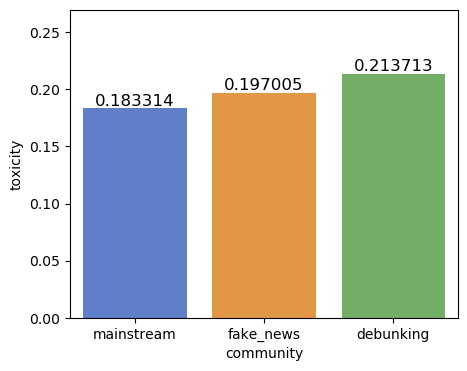

In [35]:
plt.figure(figsize=(5, 4))
cols = ['#4D79DB', '#FC982C', '#6cba5a']
ax = sns.barplot(x='community', y='toxicity', data=toxicity, palette=cols)
# 在每个条形上添加数值标签
for p in ax.patches:
    ax.text(p.get_x() + p.get_width()/2., p.get_height(), '%f' % float(p.get_height()), 
            fontsize=12, color='black', ha='center', va='bottom')
plt.ylim(0, 0.27)
plt.show()

#### 情感平均值和分布

##### 平均值

In [36]:
# 对一个社区计算某个种类的平均得分
def average_score(community:pd.DataFrame, liwc_res:dict, category:str):
    '''计算平均得分，分数为NAN的数据被填0'''
    user = list(community['Id'])
    total = 0
    for u in user:
        try:
            total += liwc_res[u][category]
        except:
            pass
    average = total / community.shape[0]
    return average

labels = list(com_3type.keys())
positive = [average_score(c, user_rt_sentiments_dict, 'positive') for c in com_3type.values()]
negative = [average_score(c, user_rt_sentiments_dict, 'negative') for c in com_3type.values()]
affect = [average_score(c, user_rt_sentiments_dict, 'affect') for c in com_3type.values()]

df_list = []
for k,v in {'positive':positive, 'negative':negative, 'affect':affect}.items():
    d = pd.DataFrame(columns=['category', 'community', 'score'])
    d.loc[:, 'score'] = pd.Series(v)
    d.loc[:, 'community'] = pd.Series(labels)
    d.loc[:, 'category'] = k
    df_list.append(d)

sentiments = pd.concat(df_list, axis=0)
sentiments

,category,community,score
0,positive,mainstream,0.031423
1,positive,fake_news,0.022622
2,positive,debunking,0.029222
0,negative,mainstream,0.048132
1,negative,fake_news,0.059896
2,negative,debunking,0.066628
0,affect,mainstream,0.161016
1,affect,fake_news,0.165224
2,affect,debunking,0.192504


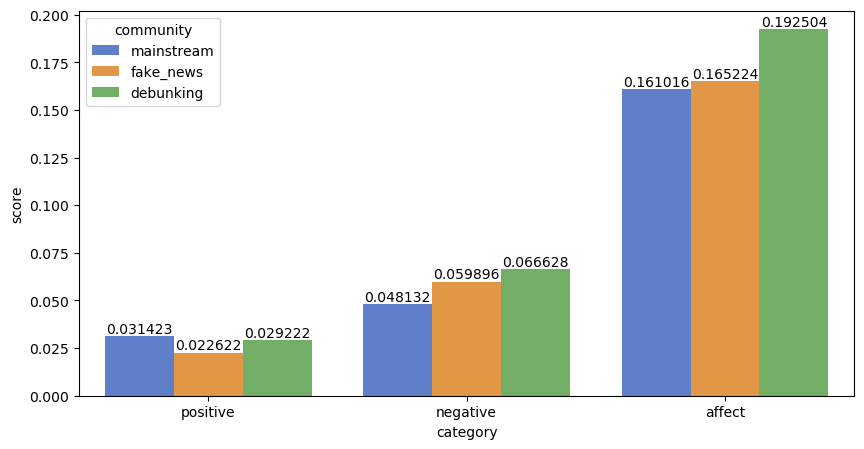

In [37]:
# 创建成组的条形图
plt.figure(figsize=(10, 5))
cols = ['#4D79DB', '#FC982C', '#6cba5a']
ax = sns.barplot(x='category', y='score', hue='community', data=sentiments, palette=cols)
# 在每个条形上添加数值标签
for p in ax.patches:
    ax.text(p.get_x() + p.get_width()/2., p.get_height(), '%f' % float(p.get_height()), 
            fontsize=10, color='black', ha='center', va='bottom')
plt.show()